<a href="https://colab.research.google.com/github/keedjk7/Machine-Learning/blob/main/Activity7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn import tree
from matplotlib.pylab import rcParams

#(A) Get Data

In [ ]:
df = pd.read_csv('sample_data/Coffee-modified.csv')
df.columns,df.shape

(Index(['ID', 'Species', 'Owner', 'Country.of.Origin', 'Farm.Name',
        'Lot.Number', 'Mill', 'ICO.Number', 'Company', 'Altitude', 'Region',
        'Producer', 'Number.of.Bags', 'Bag.Weight', 'In.Country.Partner',
        'Harvest.Year', 'Grading.Date', 'Owner.1', 'Variety',
        'Processing.Method', 'Aroma', 'Flavor', 'Aftertaste', 'Acidity', 'Body',
        'Balance', 'Uniformity', 'Clean.Cup', 'Sweetness', 'Cupper.Points',
        'Total.Cup.Points', 'Moisture', 'Category.One.Defects', 'Quakers',
        'Color', 'Category.Two.Defects', 'Expiration', 'Certification.Body',
        'Certification.Address', 'Certification.Contact', 'unit_of_measurement',
        'altitude_low_meters', 'altitude_high_meters', 'altitude_mean_meters'],
       dtype='object'), (1311, 44))

In [ ]:
df = df[['Total.Cup.Points', 'Species','Country.of.Origin','Processing.Method', 'Aroma', 'Flavor', 'Aftertaste','Acidity','Body', 'Balance', 'Uniformity', 'Moisture', 'altitude_mean_meters']]
df.shape

(1311, 13)

In [ ]:
count_nan = df.isnull().sum()
count_nan

Total.Cup.Points          0
Species                   0
Country.of.Origin         1
Processing.Method       152
Aroma                     0
Flavor                    0
Aftertaste                0
Acidity                   0
Body                      0
Balance                   0
Uniformity                0
Moisture                  0
altitude_mean_meters    229
dtype: int64

In [ ]:
df = df.dropna()
df.shape

(1003, 13)

In [ ]:
df.describe()

,Total.Cup.Points,Aroma,Flavor,Aftertaste,Acidity,Body,Balance,Uniformity,Moisture,altitude_mean_meters
count,1003.000000,1003.000000,1003.000000,1003.000000,1003.000000,1003.000000,1003.000000,1003.000000,1003.000000,1003.000000
mean,82.126949,7.567488,7.513779,7.385633,7.526221,7.504287,7.499302,9.870219,0.094985,1816.792017
std,2.631610,0.301361,0.324487,0.332735,0.307827,0.272824,0.340801,0.445371,0.043468,9112.472930
min,59.830000,5.080000,6.170000,6.170000,5.250000,6.330000,6.080000,6.000000,0.000000,1.000000
25%,81.170000,7.420000,7.330000,7.170000,7.330000,7.330000,7.330000,10.000000,0.100000,1100.000000
50%,82.420000,7.580000,7.500000,7.420000,7.500000,7.500000,7.500000,10.000000,0.110000,1310.640000
75%,83.580000,7.750000,7.670000,7.580000,7.670000,7.670000,7.670000,10.000000,0.120000,1600.000000
max,90.580000,8.750000,8.830000,8.670000,8.750000,8.500000,8.580000,10.000000,0.170000,190164.000000


In [ ]:
df_Y = df[['Total.Cup.Points']]
df_X = df.drop(labels='Total.Cup.Points', axis=1)
Y = df_Y.to_numpy()
YforTrain = df['Total.Cup.Points']
YforTrain

0       90.58
1       89.92
3       89.00
4       88.83
9       88.25
        ...  
1305    69.17
1306    68.33
1307    67.92
1308    63.08
1309    59.83
Name: Total.Cup.Points, Length: 1003, dtype: float64

#(B) Prepare Y

In [ ]:
Bean_grade = []
grade1 = 0
grade2 = 0
grade3 = 0
rating_pctile = np.percentile( Y, [75, 90])
for i in range(len(Y)):
  if Y[i] < rating_pctile[0]: #75 percentile
    Bean_grade.append(1)
    grade1 = grade1 + 1
  if rating_pctile[0] <= Y[i] < rating_pctile [1]: # 90 percentile
    Bean_grade.append(2) 
    grade2 = grade2 + 1
  if Y[i] >= rating_pctile[1]:
    Bean_grade.append(3)
    grade3 = grade3 + 1

BeanForBar = pd.DataFrame([[1,grade1],[2,grade2],[3,grade3]], columns = ['Bean_grade','NSamples'])
# df_Y.join(Bean_grade)
# Bean_grade
BeanForBar

,Bean_grade,NSamples
0,1,746
1,2,152
2,3,105


In [ ]:
fig = px.bar( BeanForBar, x = 'Bean_grade', y = 'NSamples', color='NSamples', range_y=[0.0,1000])
fig.show()

#(C)Prepare X

In [ ]:
dfForScaler = df_X.select_dtypes(exclude=['object'])
standard_scaler = StandardScaler()
afterScaler = standard_scaler.fit_transform(dfForScaler)
afterScaler

array([[ 3.66027395,  4.05834234,  3.86195047, ...,  0.29154442,
         0.57576249,  0.0283498 ],
       [ 3.92586906,  3.56500983,  3.35077911, ...,  0.29154442,
         0.57576249,  0.0283498 ],
       [ 2.00030453,  3.28751029,  3.11022788, ...,  0.29154442,
         0.34559518,  0.02011522],
       ...,
       [-2.71400863, -2.87914607, -2.90355288, ..., -1.21357018,
         1.03609711, -0.16104561],
       [-1.05403921, -2.87914607, -3.17417302, ..., -8.69421438,
         0.8059298 , -0.07869978],
       [-0.2240545 , -2.60164653, -2.15183029, ..., -4.20133498,
         0.11542787, -0.04385981]])

In [ ]:
dfAfterScaler = pd.DataFrame(data = afterScaler, index = dfForScaler.index, columns = dfForScaler.columns)
dfAfterScaler

,Aroma,Flavor,Aftertaste,Acidity,Body,Balance,Uniformity,Moisture,altitude_mean_meters
0,3.660274,4.058342,3.861950,3.977528,3.651469,2.702919,0.291544,0.575762,0.028350
1,3.925869,3.565010,3.350779,3.424993,3.358094,2.702919,0.291544,0.575762,0.028350
3,2.000305,3.287510,3.110228,2.904961,3.651469,2.203845,0.291544,0.345595,0.020115
4,2.265900,3.040844,2.599057,3.164977,3.358094,2.438704,0.291544,0.575762,0.028350
9,1.701510,3.287510,3.350779,3.164977,0.607701,2.702919,0.291544,0.115428,0.000627
...,...,...,...,...,...,...,...,...,...
1305,-1.884024,-3.649978,-3.655275,-3.335427,-3.059490,-3.902470,-4.201335,0.115428,-0.040272
1306,-1.618429,-2.108314,-3.414724,-0.345241,-0.932520,-2.199748,0.291544,0.345595,-0.100659
1307,-2.714009,-2.879146,-2.903553,-2.782892,-1.555942,-2.434606,-1.213570,1.036097,-0.161046
1308,-1.054039,-2.879146,-3.174173,-4.147977,-3.976288,-4.166686,-8.694214,0.805930,-0.078700


In [ ]:
dataCorr = dfAfterScaler.corr()
sns.heatmap(dataCorr)

In [ ]:
lower = pd.DataFrame(np.tril(dataCorr,-1), columns = dataCorr.columns)
lower

,Aroma,Flavor,Aftertaste,Acidity,Body,Balance,Uniformity,Moisture,altitude_mean_meters
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
1,0.730664,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
2,0.677823,0.848104,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
3,0.603396,0.752555,0.690242,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
4,0.551581,0.685150,0.685350,0.617736,0.000000,0.000000,0.000000,0.000000,0.0
5,0.611650,0.734386,0.764757,0.644035,0.702057,0.000000,0.000000,0.000000,0.0
6,0.135270,0.222574,0.242037,0.191687,0.132675,0.243083,0.000000,0.000000,0.0
7,-0.077636,-0.120497,-0.166140,-0.099542,-0.201107,-0.217252,-0.005526,0.000000,0.0
8,-0.020067,-0.013267,-0.027426,0.003069,-0.019029,-0.016694,-0.012340,0.019164,0.0


In [ ]:
to_drop = [column for column in lower if any(lower[column] > 0.8) or any(lower[column] < -0.8)]
dfAfterScaler.drop(to_drop, inplace=True, axis=1)
dfAfterScaler, to_drop

(         Aroma  Aftertaste   Acidity      Body   Balance  Uniformity  \
 0     3.660274    3.861950  3.977528  3.651469  2.702919    0.291544   
 1     3.925869    3.350779  3.424993  3.358094  2.702919    0.291544   
 3     2.000305    3.110228  2.904961  3.651469  2.203845    0.291544   
 4     2.265900    2.599057  3.164977  3.358094  2.438704    0.291544   
 9     1.701510    3.350779  3.164977  0.607701  2.702919    0.291544   
 ...        ...         ...       ...       ...       ...         ...   
 1305 -1.884024   -3.655275 -3.335427 -3.059490 -3.902470   -4.201335   
 1306 -1.618429   -3.414724 -0.345241 -0.932520 -2.199748    0.291544   
 1307 -2.714009   -2.903553 -2.782892 -1.555942 -2.434606   -1.213570   
 1308 -1.054039   -3.174173 -4.147977 -3.976288 -4.166686   -8.694214   
 1309 -0.224054   -2.151830  0.467310 -0.639144 -2.434606   -4.201335   
 
       Moisture  altitude_mean_meters  
 0     0.575762              0.028350  
 1     0.575762              0.028350  
 3

In [ ]:
dfForEncode = df.select_dtypes(include=['object'])
dfGetEncode = pd.get_dummies(dfForEncode, columns = dfForEncode.columns, drop_first=True)
dfGetEncode

,Country.of.Origin_Burundi,Country.of.Origin_China,Country.of.Origin_Colombia,Country.of.Origin_Costa Rica,Country.of.Origin_Cote d?Ivoire,Country.of.Origin_Ecuador,Country.of.Origin_El Salvador,Country.of.Origin_Ethiopia,Country.of.Origin_Guatemala,Country.of.Origin_Haiti,...,Country.of.Origin_Thailand,Country.of.Origin_Uganda,Country.of.Origin_United States,Country.of.Origin_United States (Puerto Rico),Country.of.Origin_Vietnam,Country.of.Origin_Zambia,Processing.Method_Other,Processing.Method_Pulped natural / honey,Processing.Method_Semi-washed / Semi-pulped,Processing.Method_Washed / Wet
0,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
1,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
3,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
9,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1305,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1306,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1307,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
1308,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0


In [ ]:
YforTrain = YforTrain.astype(int)

In [ ]:
Rseed = 42
x_train_set, x_test, y_train_set, y_test = train_test_split(dfAfterScaler, YforTrain, test_size = 0.3, random_state = Rseed)
x_train, x_validate, y_train, y_validate = train_test_split(x_train_set, y_train_set, test_size = 0.3, random_state = Rseed)
# test_size = int(np.floor(0.3 * len( dfForScaler )))
# train_size = int(np.floor(0.7 * len( dfForScaler )))
# x_train, x_test = dfForScaler[0:train_size], dfForScaler[train_size:len(dfForScaler)]
# y_train, y_test = YforTrain[0:train_size], YforTrain[train_size:len(dfForScaler)]

#(A) KNN Model Training and Testing

In [ ]:
k = [1, 3, 5, 7, 9, 11, 13, 15, 17, 19, 25, 35] # try at least 3 values

KNNScoreTemp = []

for i in k:
  modelKNN = KNeighborsClassifier(n_neighbors=i, p=2)
  # y_train.astype({'Total.Cup.Points': 'int64'})
  # YforTrain = YforTrain.astype(int)
  modelKNN.fit(x_train,y_train)
  y_pred= modelKNN.predict(x_test)
  KNNScore = accuracy_score(y_test, y_pred)
  KNNScoreTemp.append(KNNScore)

KNNScoreShow = pd.DataFrame({'k':k, 'KNN_Score':KNNScoreTemp})
KNNScoreShow

,k,KNN_Score
0,1,0.561462
1,3,0.594684
2,5,0.654485
3,7,0.654485
4,9,0.657807
5,11,0.664452
6,13,0.651163
7,15,0.654485
8,17,0.634551
9,19,0.644518


In [ ]:
fig = px.bar( KNNScoreShow, x = 'k', y = 'KNN_Score', color='KNN_Score', range_y=[0.4,0.9])
fig.show()

In [ ]:
print('Confusion Matrix: ')
print(confusion_matrix(y_test, y_pred))
print('Classification Report: ')
print(classification_report(y_test, y_pred))

Confusion Matrix: 
[[ 0  0  0  3  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  1  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  4  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  2  1  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  1  0  7  2  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  1 17  2  1  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  9 16  1  1  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0 27 10  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  4 57  9  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  7 66  3  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  8 20  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  1 11  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  3  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  2  1  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  1  1  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  1  0  0  0  0]]
Classification Report: 
              precision    recall  f1-score   support

          69       0.00      0.00      0.00         3
          74       0.00      0.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



#(B) Decision Tree Model Training and Testing


In [ ]:
ASM_function = ['entropy', 'gini'] 
maxD = [4, 5, 6, None] # try at least 2 values

# ModelDT = DecisionTreeClassifier(criterion=ASM_function[0], splitter='best',max_depth = maxD[0] )
# ModelDT.fit(x_train,y_train)
# y_pred= ModelDT.predict(x_test)
# DTScore = accuracy_score(y_test, y_pred)
# print(DTScore)

# ModelDT = DecisionTreeClassifier(criterion=ASM_function[1], splitter='best',max_depth = maxD[0] )
# ModelDT.fit(x_train,y_train)
# y_pred= ModelDT.predict(x_test)
# DTScore = accuracy_score(y_test, y_pred)
# print(DTScore)

# ModelDT = DecisionTreeClassifier(criterion=ASM_function[0], splitter='best',max_depth = maxD[1] )
# ModelDT.fit(x_train,y_train)
# y_pred= ModelDT.predict(x_test)
# DTScore = accuracy_score(y_test, y_pred)
# print(DTScore)

# ModelDT = DecisionTreeClassifier(criterion=ASM_function[1], splitter='best',max_depth = maxD[1] )
# ModelDT.fit(x_train,y_train)
# y_pred= ModelDT.predict(x_test)
# DTScore = accuracy_score(y_test, y_pred)
# print(DTScore)

for i in ASM_function:
    for j in maxD:
        ModelDT = DecisionTreeClassifier(criterion=i, splitter='best',max_depth = j )
        ModelDT.fit(x_train,y_train)
        # Model Testing
        Y_pred= ModelDT.predict(x_test)
        DTScore = accuracy_score(y_test, y_pred)
        print("criterion = ",i,"max_depth =",j)
        print(DTScore)

criterion =  entropy max_depth = 4
0.5980066445182725
criterion =  entropy max_depth = 5
0.5980066445182725
criterion =  entropy max_depth = 6
0.5980066445182725
criterion =  entropy max_depth = None
0.5980066445182725
criterion =  gini max_depth = 4
0.5980066445182725
criterion =  gini max_depth = 5
0.5980066445182725
criterion =  gini max_depth = 6
0.5980066445182725
criterion =  gini max_depth = None
0.5980066445182725


In [ ]:
print('Confusion Matrix: ')
print(confusion_matrix(y_test, y_pred))
print('Classification Report: ')
print(classification_report(y_test, y_pred))

Confusion Matrix: 
[[ 0  0  0  3  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  1  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  4  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  2  1  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  1  0  7  2  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  1 17  2  1  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  9 16  1  1  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0 27 10  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  4 57  9  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  7 66  3  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  8 20  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  1 11  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  3  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  2  1  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  1  1  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  1  0  0  0  0]]
Classification Report: 
              precision    recall  f1-score   support

          69       0.00      0.00      0.00         3
          74       0.00      0.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [ ]:
##set up the parameters
rcParams['figure.figsize'] = 500,250

feature_names = x_train.columns
Labels = str(np.unique(y_train))
tree.plot_tree( ModelDT,

feature_names = feature_names,
class_names = Labels,
rounded = True,
filled = True, fontsize=9)


plt.show()

#(C) Random Forest Model Training and Testing

In [ ]:
ASM_function = ['entropy', 'gini'] 
nEstimator = 100
nJob = 2
rState = 10

RandomF = RandomForestClassifier(criterion=ASM_function[0],n_estimators=nEstimator, n_jobs=nJob, random_state=rState)
RandomF.fit(x_train,y_train)

y_pred= RandomF.predict(x_test)
RFScore = accuracy_score(y_test, y_pred)
print(RFScore)

0.6677740863787376


In [ ]:
print('Confusion Matrix: ')
print(confusion_matrix(y_test, y_pred))
print('Classification Report: ')
print(classification_report(y_test, y_pred))

Confusion Matrix: 
[[ 0  3  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  1  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  1  1  0  1  0  1  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  1  0  1  1  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  1  7  2  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  1  2  1 10  6  1  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  3 13  9  1  1  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  1  2 30  3  1  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  6 56  8  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  2  7 62  4  1  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  1  0  4 23  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  7  3  2  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  1  1  1  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  0  2  1  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  1  1  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  1  0  0]]
Classification Report: 
              precision    recall  f1-

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control 

#(B) Random Forest Model Training and Testing

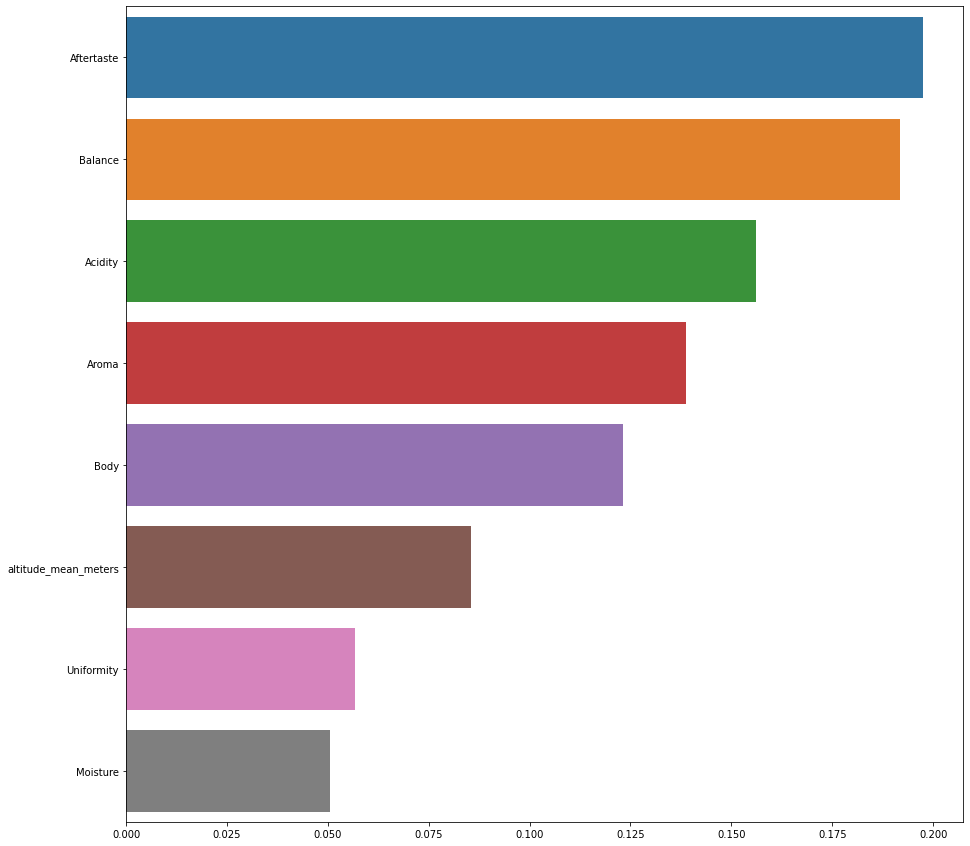

In [ ]:
feature_imp = pd.Series(RandomF.feature_importances_, index = feature_names).sort_values(ascending=False)

plt.figure(figsize=(15,15))
sns.barplot(x=feature_imp, y=feature_imp.index)

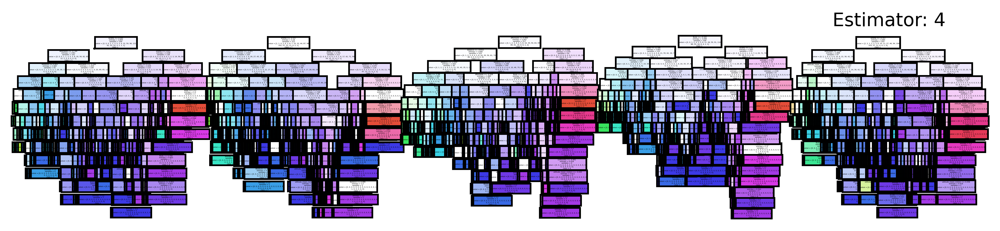

In [ ]:
# rcParams['figure.figsize'] = 120,70
fig, axes = plt.subplots(nrows = 1,ncols = 5,figsize = (10,2), dpi=500)

for index in range(0, 5):
  tree.plot_tree( RandomF.estimators_[index],
  feature_names = feature_names,
  class_names= Labels,
  filled = True,
  ax = axes[index]);
axes[index].set_title('Estimator: ' + str(index), fontsize = 11)
plt.show()

#Hyperparameter Tuning (GridsearchCV)

In [ ]:
classification = { 'KNN': KNeighborsClassifier(), 'DT': DecisionTreeClassifier(), 'RF': RandomForestClassifier() }
K_list = [1, 3, 5, 7, 9 , 11, 13, 15, 17, 19, 21, 23, 25, 35, 45]
KNN_param = dict(n_neighbors=K_list)

ASM_function = ['entropy', 'gini']
maxD = [ 4, 5, 6, None]
maxF = ["auto", "log2", None]
minSample = [1, 2, 4]
DT_param= dict(criterion=ASM_function, max_depth = maxD, min_samples_leaf = minSample, max_features = maxF)

nEst = [10, 30, 50, 100]
RF_param = dict(n_estimators = nEst, criterion=ASM_function, max_depth = maxD, min_samples_leaf = minSample,
max_features = maxF)

for EST in classification:
    model = classification[EST]
    if (EST == 'KNN'):
        params = KNN_param
    elif(EST == 'DT'):
        params = DT_param
    else:
        params = RF_param
    grid = GridSearchCV( estimator = model,n_jobs = 1,verbose = 10,scoring = 'accuracy', cv = 2,param_grid = params )
grid_result = grid.fit(x_train, y_train)

Fitting 2 folds for each of 288 candidates, totalling 576 fits
[CV 1/2; 1/288] START criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=1, n_estimators=10
[CV 1/2; 1/288] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=1, n_estimators=10;, score=0.480 total time=   0.0s
[CV 2/2; 1/288] START criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=1, n_estimators=10
[CV 2/2; 1/288] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=1, n_estimators=10;, score=0.535 total time=   0.0s
[CV 1/2; 2/288] START criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=1, n_estimators=30
[CV 1/2; 2/288] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=1, n_estimators=30;, score=0.598 total time=   0.1s
[CV 2/2; 2/288] START criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=1, n_estimators=30


/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_split.py:680: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=2.



[CV 2/2; 2/288] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=1, n_estimators=30;, score=0.506 total time=   0.1s
[CV 1/2; 3/288] START criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=1, n_estimators=50
[CV 1/2; 3/288] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=1, n_estimators=50;, score=0.585 total time=   0.1s
[CV 2/2; 3/288] START criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=1, n_estimators=50
[CV 2/2; 3/288] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=1, n_estimators=50;, score=0.518 total time=   0.1s
[CV 1/2; 4/288] START criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=1, n_estimators=100
[CV 1/2; 4/288] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=1, n_estimators=100;, score=0.577 total time=   0.2s
[CV 2/2; 4/288] START criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=1, n_estimators=100
[

In [ ]:
print('Best params: ',grid_result.best_params_)
print('Best score: ', grid_result.best_score_)

Best params:  {'criterion': 'gini', 'max_depth': None, 'max_features': 'log2', 'min_samples_leaf': 2, 'n_estimators': 100}
Best score:  0.59673137547702


In [ ]:
mean = grid_result.cv_results_['mean_test_score']
std = grid_result.cv_results_['std_test_score']
param = grid_result.cv_results_['params']
bar_mean_entropy = []
bar_mean_gini = []
bar_std_entropy = []
bar_std_gini = []
bar_param_entropy = []
bar_param_gini = []

for mean, stdev, param in zip(mean, std, param):
    print("%f (%f) with: %r" % (mean, stdev, param))
    if param['criterion'] == 'entropy':
        bar_mean_entropy.append(mean)
        bar_std_entropy.append(stdev)
        bar_param_entropy.append("max_depth : "+ str(param['max_depth']) + ", max_feature : " + str(param['max_features']) + ", min_samples_leaf : " + str(param['min_samples_leaf']) + ", n_estimators : " + str(param['n_estimators']))
    else:
        bar_mean_gini.append(mean)
        bar_std_gini.append(stdev)
        bar_param_gini.append("max_depth : "+ str(param['max_depth']) + ", max_feature : " + str(param['max_features']) + ", min_samples_leaf : " + str(param['min_samples_leaf']) + ", n_estimators : " + str(param['n_estimators']))

0.507184 (0.027510) with: {'criterion': 'entropy', 'max_depth': 4, 'max_features': 'auto', 'min_samples_leaf': 1, 'n_estimators': 10}
0.551842 (0.045719) with: {'criterion': 'entropy', 'max_depth': 4, 'max_features': 'auto', 'min_samples_leaf': 1, 'n_estimators': 30}
0.551867 (0.033499) with: {'criterion': 'entropy', 'max_depth': 4, 'max_features': 'auto', 'min_samples_leaf': 1, 'n_estimators': 50}
0.558006 (0.019230) with: {'criterion': 'entropy', 'max_depth': 4, 'max_features': 'auto', 'min_samples_leaf': 1, 'n_estimators': 100}
0.523370 (0.025411) with: {'criterion': 'entropy', 'max_depth': 4, 'max_features': 'auto', 'min_samples_leaf': 2, 'n_estimators': 10}
0.517264 (0.023386) with: {'criterion': 'entropy', 'max_depth': 4, 'max_features': 'auto', 'min_samples_leaf': 2, 'n_estimators': 30}
0.543778 (0.005002) with: {'criterion': 'entropy', 'max_depth': 4, 'max_features': 'auto', 'min_samples_leaf': 2, 'n_estimators': 50}
0.557997 (0.023303) with: {'criterion': 'entropy', 'max_depth

In [ ]:
bar_param_entropy

['max_depth : 4, max_feature : auto, min_samples_leaf : 1, n_estimators : 10',
 'max_depth : 4, max_feature : auto, min_samples_leaf : 1, n_estimators : 30',
 'max_depth : 4, max_feature : auto, min_samples_leaf : 1, n_estimators : 50',
 'max_depth : 4, max_feature : auto, min_samples_leaf : 1, n_estimators : 100',
 'max_depth : 4, max_feature : auto, min_samples_leaf : 2, n_estimators : 10',
 'max_depth : 4, max_feature : auto, min_samples_leaf : 2, n_estimators : 30',
 'max_depth : 4, max_feature : auto, min_samples_leaf : 2, n_estimators : 50',
 'max_depth : 4, max_feature : auto, min_samples_leaf : 2, n_estimators : 100',
 'max_depth : 4, max_feature : auto, min_samples_leaf : 4, n_estimators : 10',
 'max_depth : 4, max_feature : auto, min_samples_leaf : 4, n_estimators : 30',
 'max_depth : 4, max_feature : auto, min_samples_leaf : 4, n_estimators : 50',
 'max_depth : 4, max_feature : auto, min_samples_leaf : 4, n_estimators : 100',
 'max_depth : 4, max_feature : log2, min_samples_

In [ ]:
x = np.arange(len(bar_mean_entropy))
w = 0.5
fig, ax = plt.subplots()
fig = plt.title('Criterion : entropy')
rect1 = plt.bar(x-w/2,bar_mean_entropy,w,color = 'b')
rect2 = plt.bar(x+w/2,bar_std_entropy,w,color = 'r')
ax.set_xticks(x, labels = bar_param_entropy,rotation = 90)
plt.subplots_adjust(bottom=0.50)
plt.show()

TypeError: ignored